In [1]:
# Importing the Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import cv2

2024-05-02 09:12:54.160167: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-02 09:12:54.160266: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-02 09:12:54.282292: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Dataset Path
path = '/kaggle/input/kvasir-dataset/kvasir-dataset'

# Single image Analysis

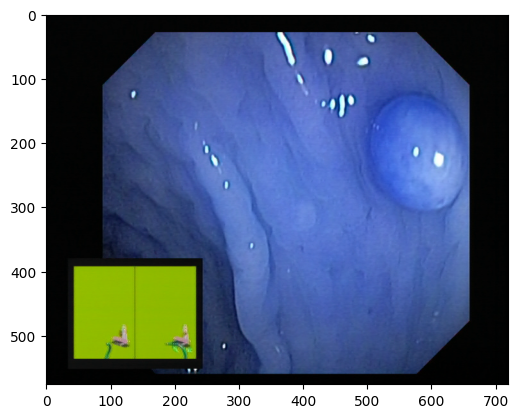

In [3]:
# Printing the first image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/0014d89e-5afa-4186-99f9-4400c8c58a18.jpg')
plt.imshow(image)

In [4]:
print("The Shape of the Image is: ",image.shape)

The Shape of the Image is:  (576, 720, 3)


In [5]:
img_height = 300
img_width = 300
batch_size = 32

In [6]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    path,
    validation_split = 0.2,
    shuffle = True,
    subset = 'training',
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    path,
    validation_split = 0.2,
    subset = 'validation',
    shuffle = True,
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = batch_size
)

Found 4000 files belonging to 8 classes.
Using 3200 files for training.
Found 4000 files belonging to 8 classes.
Using 800 files for validation.


In [7]:
class_labels = train_ds.class_names
class_labels

['dyed-lifted-polyps',
 'dyed-resection-margins',
 'esophagitis',
 'normal-cecum',
 'normal-pylorus',
 'normal-z-line',
 'polyps',
 'ulcerative-colitis']

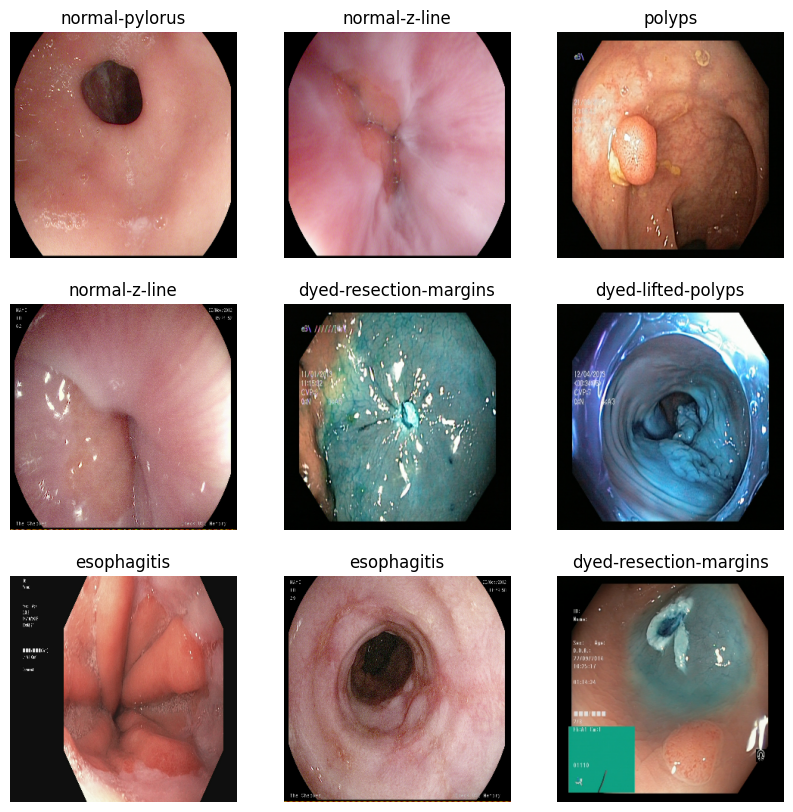

In [8]:
plt.figure(figsize = (10,10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        plt.title(class_labels[labels[i]])
        plt.axis('off')
plt.show()

## Average Filter

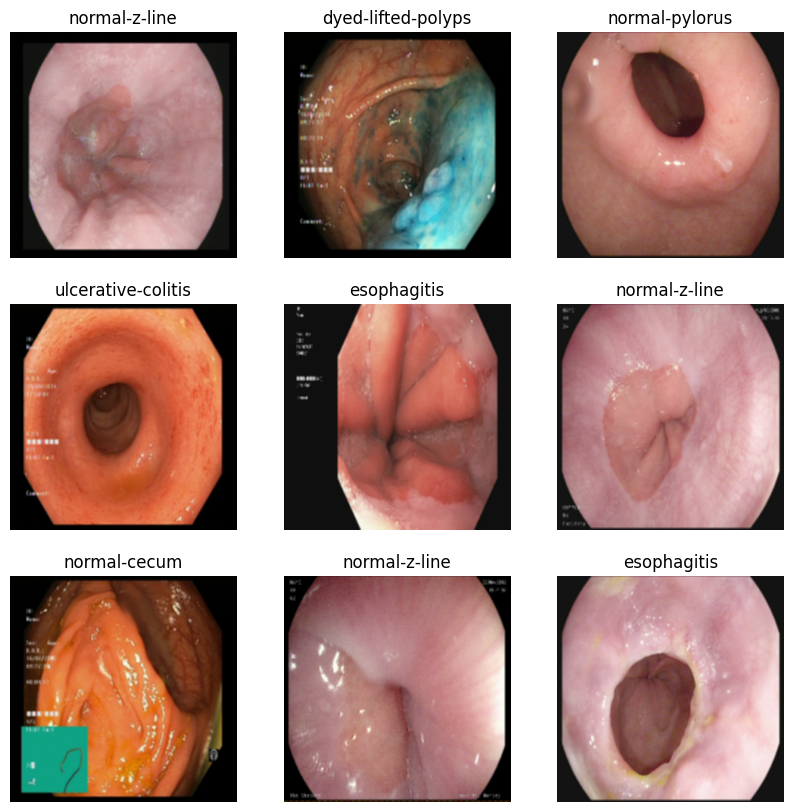

In [9]:
# Define the average filter function
def apply_average_filter(image):
    kernel = np.ones((3, 3), dtype=np.float32) / 9  # 3x3 average filter kernel
    filtered_image = cv2.filter2D(image, -1, kernel)
    return filtered_image

# Assuming train_ds is your dataset containing images and labels
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        
        # Convert image to numpy array and apply the average filter
        filtered_image = apply_average_filter(images[i].numpy().astype('uint8'))
        
        plt.imshow(filtered_image)
        plt.title(class_labels[labels[i]])
        plt.axis('off')

plt.show()


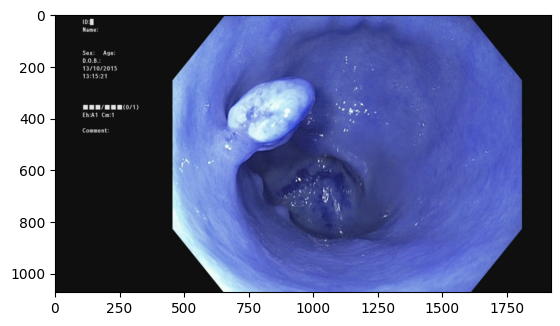

In [10]:
import cv2
import numpy as np

# Load the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/007e4d46-c617-418f-8a04-d34716adcb65.jpg')

# Define the size of the kernel (e.g., 3x3 for a small blur)
kernel_size = 3

# Create the kernel for the average filter
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)

# Apply the filter to the image
filtered_image = cv2.filter2D(image, -1, kernel)

# print(filtered_image)
# print(image.shape)
# print(filtered_image.shape)

plt.imshow(filtered_image)


## Median Filter

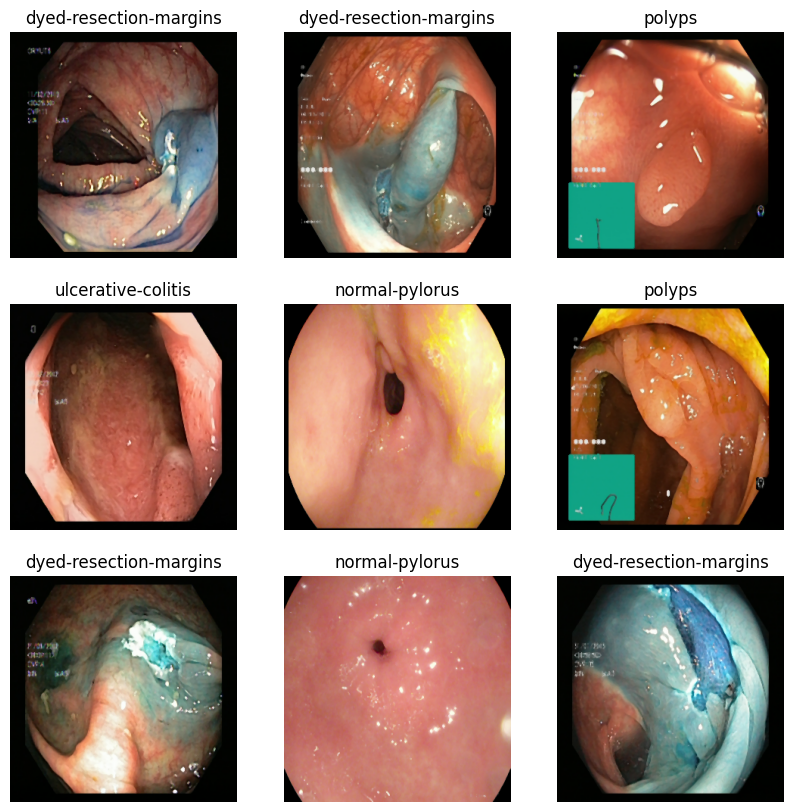

In [11]:
# Define the median filter function
def apply_median_filter(image):
    filtered_image = cv2.medianBlur(image, 3)  # Applying a median filter with kernel size 3x3
    return filtered_image

# Assuming train_ds is your dataset containing images and labels
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        
        # Convert image to numpy array and apply the median filter
        filtered_image = apply_median_filter(images[i].numpy().astype('uint8'))
        
        plt.imshow(filtered_image)
        plt.title(class_labels[labels[i]])
        plt.axis('off')

plt.show()

## Image reduction

Original image shape: (576, 720, 3)
Reduced image shape: (69, 86, 3)


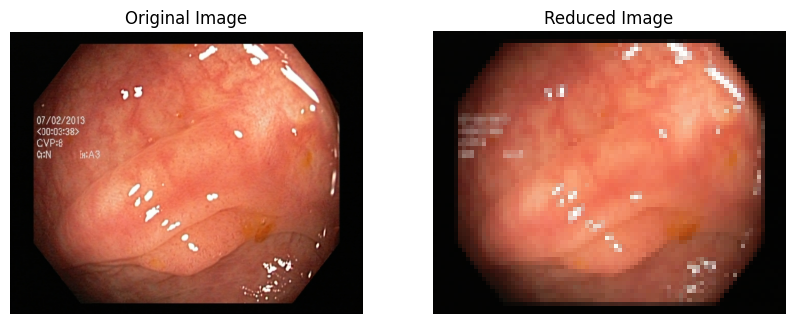

In [12]:
import cv2
import matplotlib.pyplot as plt

# Load the original image
original_image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/01c32c31-d74e-4cec-a0a1-0c2f51451af0.jpg')

# Define the scaling factor (e.g., 0.5 for halving the size)
scale_factor = 0.12

# Downsample the image
reduced_image = cv2.resize(original_image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_AREA)

# Print the shapes of the original and reduced images
print("Original image shape:", original_image.shape)
print("Reduced image shape:", reduced_image.shape)

# Convert BGR to RGB for plotting using Matplotlib
original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
reduced_image_rgb = cv2.cvtColor(reduced_image, cv2.COLOR_BGR2RGB)

# Plot the images
plt.figure(figsize=(10, 5))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image_rgb)
plt.title('Original Image')
plt.axis('off')

# Plot the reduced image
plt.subplot(1, 2, 2)
plt.imshow(reduced_image_rgb)
plt.title('Reduced Image')
plt.axis('off')

# Show the plot
plt.show()


## Image Enlargement
1. Bilinear Interpolation
2. Perform Negative Image Operation

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def nearest_neighbor_resize(image, scale_factor):
    height, width = image.shape[:2]
    new_height = int(height * scale_factor)
    new_width = int(width * scale_factor)
    resized_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    
    for i in range(new_height):
        for j in range(new_width):
            x = min(int(i / scale_factor), height - 1)
            y = min(int(j / scale_factor), width - 1)
            resized_image[i, j] = image[x, y]
            
    return resized_image

def bilinear_interpolation_resize(image, scale_factor):
    height, width = image.shape[:2]
    new_height = int(height * scale_factor)
    new_width = int(width * scale_factor)
    resized_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    
    for i in range(new_height):
        for j in range(new_width):
            x = i / scale_factor
            y = j / scale_factor
            x1, y1 = int(x), int(y)
            x2, y2 = min(x1 + 1, height - 1), min(y1 + 1, width - 1)
            dx, dy = x - x1, y - y1
            resized_image[i, j] = (1 - dx) * (1 - dy) * image[x1, y1] + \
                                  dx * (1 - dy) * image[x2, y1] + \
                                  (1 - dx) * dy * image[x1, y2] + \
                                  dx * dy * image[x2, y2]
            
    return resized_image

def psnr(image1, image2):
    mse = np.mean((image1 - image2) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

# Load the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/01c32c31-d74e-4cec-a0a1-0c2f51451af0.jpg')

# Resize using nearest neighbor method
resized_nearest = nearest_neighbor_resize(image, 0.5)

# Resize using bilinear interpolation method
resized_bilinear = bilinear_interpolation_resize(image, 0.5)

# Calculate PSNR
psnr_nearest = psnr(image, resized_nearest)
psnr_bilinear = psnr(image, resized_bilinear)

# Display results
plt.figure(figsize = (10,8))

plt.subplot(1,3,1)
plt.imshow('Original Image', image)
plt.title('Original_Image')

plt.subplot(1,3,2)
plt.imshow('Nearest Neighbor Resized Image', resized_nearest)
plt.title('NBH_Resized_Image')

plt.subplot(1,3,3)
plt.imshow('Bilinear Interpolation Resized Image', resized_bilinear)
plt.title('Bilinear Interpolation Resized Image')

# print(f'PSNR (Nearest Neighbor): {psnr_nearest:.2f} dB')
# print(f'PSNR (Bilinear Interpolation): {psnr_bilinear:.2f} dB')



ValueError: operands could not be broadcast together with shapes (576,720,3) (288,360,3) 

(600, 800, 3)


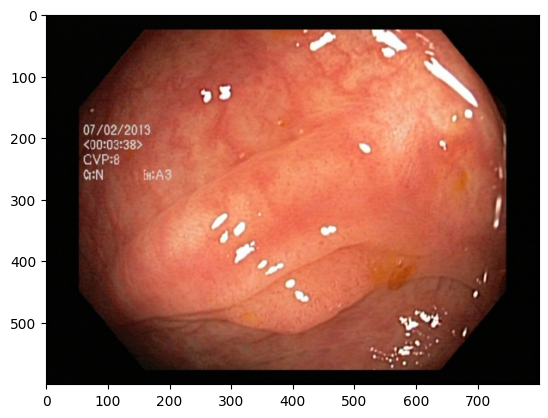

In [13]:
import cv2

def bilinear_interpolation(image, new_width, new_height):
    # Get the dimensions of the original image
    height, width = image.shape[:2]

    # Calculate the scale factors
    scale_x = new_width / width
    scale_y = new_height / height

    # Create a new blank image with the desired dimensions
    resized_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)

    # Iterate over each pixel in the new image
    for y in range(new_height):
        for x in range(new_width):
            # Calculate the corresponding position in the original image
            src_x = x / scale_x
            src_y = y / scale_y

            # Find the four nearest pixels in the original image
            src_x_0 = int(src_x)
            src_y_0 = int(src_y)
            src_x_1 = min(src_x_0 + 1, width - 1)
            src_y_1 = min(src_y_0 + 1, height - 1)

            # Calculate the fractional parts
            dx = src_x - src_x_0
            dy = src_y - src_y_0

            # Perform bilinear interpolation
            interpolated_value = (
                (1 - dx) * (1 - dy) * image[src_y_0, src_x_0] +
                dx * (1 - dy) * image[src_y_0, src_x_1] +
                (1 - dx) * dy * image[src_y_1, src_x_0] +
                dx * dy * image[src_y_1, src_x_1]
            )

            # Assign the interpolated value to the new image
            resized_image[y, x] = interpolated_value

    return resized_image

# Read the original image
original_image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/01c32c31-d74e-4cec-a0a1-0c2f51451af0.jpg')

# Define the new dimensions
new_width = 800
new_height = 600

# Perform bilinear interpolation
resized_image = bilinear_interpolation(original_image, new_width, new_height)

# Display the resized image
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
print(resized_image.shape)
plt.show()
# cv2.waitKey(0)
# cv2.destroyAllWindows()


# Perform Negative Image Operation

(576, 720, 3)
(576, 720, 3)


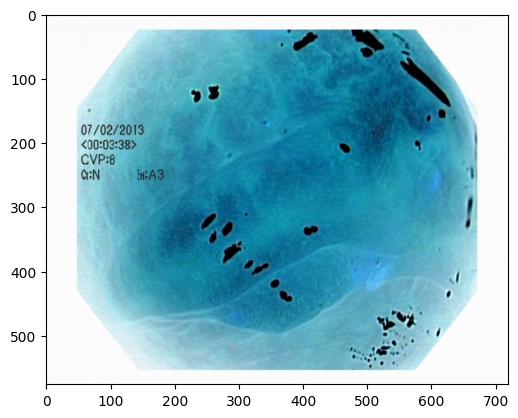

In [14]:
import cv2
import numpy as np

# Read the original image
original_image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/01c32c31-d74e-4cec-a0a1-0c2f51451af0.jpg')

# Calculate the negative image
negative_image = 255 - original_image

# Display the original and negative images
# cv2.imshow('Original Image', original_image)
# cv2.imshow('Negative Image', negative_image)

plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.imshow(cv2.cvtColor(negative_image, cv2.COLOR_BGR2RGB))



print(original_image.shape)
print(negative_image.shape)


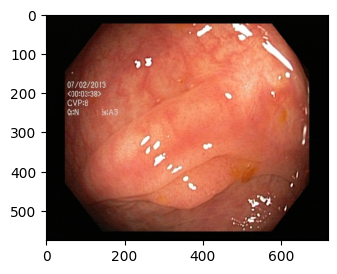

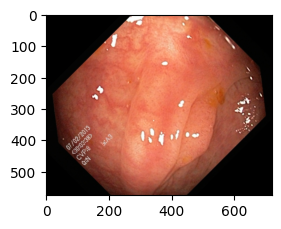

In [15]:
import cv2
import numpy as np

# Read the original image
original_image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/01c32c31-d74e-4cec-a0a1-0c2f51451af0.jpg')

# Specify the rotation angle in degrees
angle = 45

# Calculate the center of the image
height, width = original_image.shape[:2]
center = (width // 2, height // 2)

# Define the rotation matrix
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

# Apply the rotation to the image
rotated_image = cv2.warpAffine(original_image, rotation_matrix, (width, height))

# Display the original and rotated images
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.show()

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
plt.show()
# cv2.waitKey(0)
# cv2.destroyAllWindows()


# Smoothening
1. Average Filter

Text(0.5, 1.0, '5x5 Average_filter')

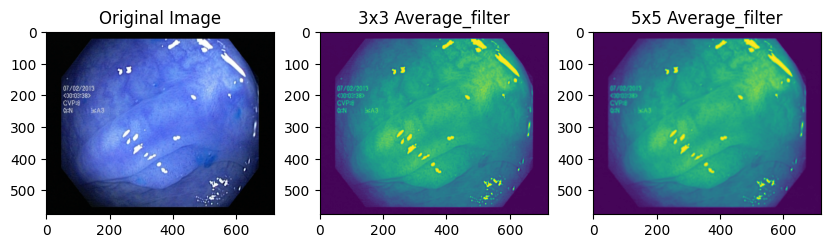

In [16]:
import cv2
import numpy as np

# Load an image from the Kvasir dataset
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/01c32c31-d74e-4cec-a0a1-0c2f51451af0.jpg'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Define the 3x3 and 5x5 filter kernels
kernel_3x3 = np.ones((3, 3), np.float32) / 9
kernel_5x5 = np.ones((5, 5), np.float32) / 25

# Apply the filters using cv2.filter2D
filtered_image_3x3 = cv2.filter2D(gray_image, -1, kernel_3x3)
filtered_image_5x5 = cv2.filter2D(gray_image, -1, kernel_5x5)

plt.figure(figsize = (10,10))
plt.subplot(1,3,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(filtered_image_3x3)
plt.title("3x3 Average_filter")


plt.subplot(1,3,3)
plt.imshow(filtered_image_5x5)
plt.title("5x5 Average_filter")




In [17]:
print(np.array(filtered_image_3x3))

[[3 4 4 ... 3 2 2]
 [3 4 4 ... 3 2 2]
 [4 4 4 ... 3 2 2]
 ...
 [2 2 3 ... 1 1 1]
 [2 2 3 ... 1 1 1]
 [2 2 3 ... 1 1 1]]


In [18]:
print(filtered_image_5x5)

[[4 4 4 ... 3 2 2]
 [4 4 4 ... 3 2 2]
 [4 4 4 ... 3 3 2]
 ...
 [2 2 3 ... 1 1 1]
 [2 2 3 ... 1 1 1]
 [2 2 3 ... 1 1 1]]


2. Median Filter

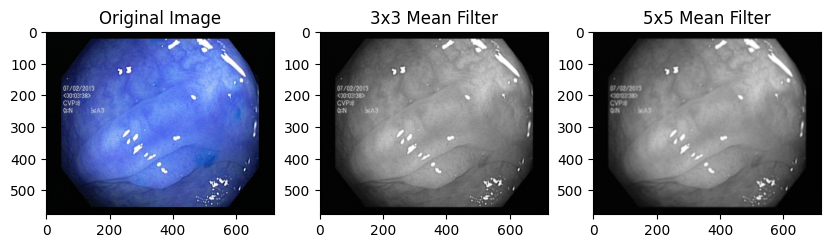

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image from the Kvasir dataset
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/01c32c31-d74e-4cec-a0a1-0c2f51451af0.jpg'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Define the 3x3 and 5x5 filter kernels
kernel_3x3 = np.ones((3, 3), np.float32) / 9
kernel_5x5 = np.ones((5, 5), np.float32) / 25

# Apply the filters using cv2.filter2D
filtered_image_3x3 = cv2.filter2D(gray_image, -1, kernel_3x3)
filtered_image_5x5 = cv2.filter2D(gray_image, -1, kernel_5x5)

plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(filtered_image_3x3, cmap='gray')
plt.title("3x3 Mean Filter")

plt.subplot(1, 3, 3)
plt.imshow(filtered_image_5x5, cmap='gray')
plt.title("5x5 Mean Filter")

plt.show()


# Image Sharpening 
1. Laplace operator

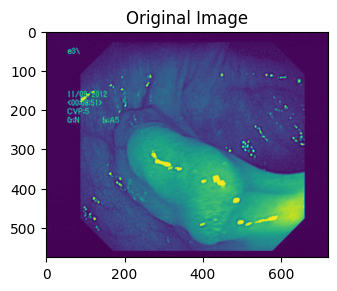

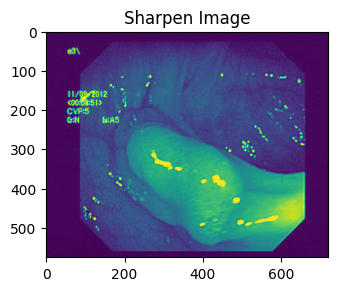

In [31]:
import cv2
import numpy as np

# Read the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg')

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Laplacian filter
laplacian = cv2.Laplacian(gray, cv2.CV_64F)

# Convert Laplacian result to the same data type as grayscale image
laplacian = np.uint8(np.absolute(laplacian))

# Add Laplacian to original image
sharp = cv2.add(gray, laplacian)

# Clip pixel values to valid range
sharp = np.clip(sharp, 0, 255)

# Display the original and sharpened images
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.imshow(gray)
plt.title('Original Image')
plt.show()

plt.figure(figsize = (8,8))
plt.subplot(1,2,2)
plt.imshow( sharp)
plt.title('Sharpen Image')
plt.show()



[[4 1 3 ... 1 1 0]
 [1 3 1 ... 1 1 0]
 [1 2 1 ... 1 1 0]
 ...
 [3 3 2 ... 1 1 1]
 [0 0 0 ... 2 2 2]
 [0 0 0 ... 2 2 2]]


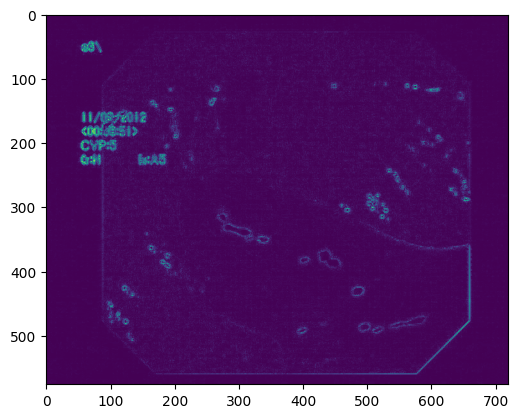

In [35]:
print(laplacian)
plt.imshow(laplacian)

# Sharpend Regions
# Results after sharpen the gaussian filter

2. Sobel Operator

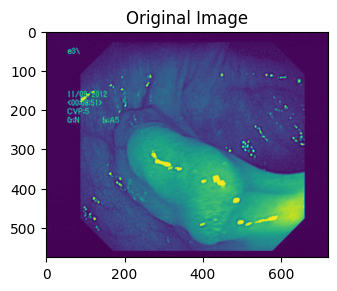

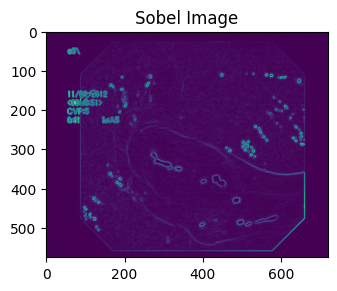

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Sobel operator in the horizontal direction
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)

# Apply Sobel operator in the vertical direction
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

# Compute the magnitude of the gradients
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Normalize the magnitude to the range [0, 255]
magnitude_normalized = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Display the original and sharpened images
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.imshow(gray)
plt.title('Original Image')
plt.show()

plt.figure(figsize = (8,8))
plt.subplot(1,2,2)
plt.imshow( magnitude_normalized)
plt.title('Sobel Image')
plt.show()


# Gamma

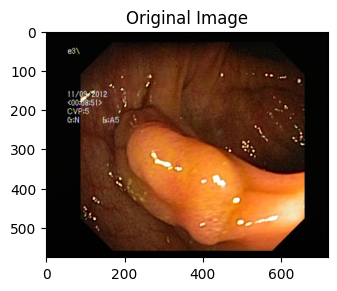

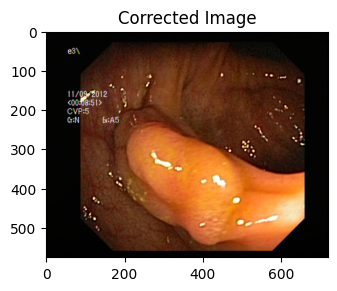

MSE: 1.8332715034484863
PSNR: 45.49853587130593


In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def gamme(image_path, gamma_value):
    # Read the image
    image = cv2.imread(image_path)

    # Convert image to floating point representation
    image_float = image.astype(np.float32) / 255.0

    # Apply gamma correction
    gamma = gamma_value
    corrected_image = np.power(image_float, gamma)

    # Convert back to uint8
    corrected_image = (corrected_image * 255).astype(np.uint8)

    # Display original image
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    plt.title('Original Image')
    plt.show()

    # Display corrected image
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    plt.title('Corrected Image')
    plt.show()

    # Calculate PSNR and MSE
    mse = np.mean((image.astype(np.float32) - corrected_image.astype(np.float32)) ** 2)
    psnr = cv2.PSNR(image, corrected_image)

    print(f"MSE: {mse}")
    print(f"PSNR: {psnr}")

# Example usage:
image_path = "/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg"  # Replace with your image path
gamma_value = 0.97  # Replace with your desired gamma value
gamme(image_path, gamma_value)


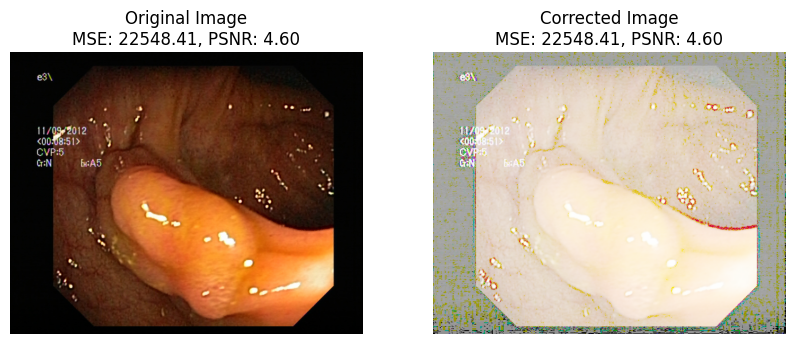

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def gamme(image_path, gamma_value):
    # Read the image
    image = cv2.imread(image_path)

    # Convert image to floating point representation
    image_float = image.astype(np.float32) / 255.0

    # Apply gamma correction
    gamma = gamma_value
    corrected_image = np.power(image_float, gamma)

    # Convert back to uint8
    corrected_image = (corrected_image * 255).astype(np.uint8)

    # Calculate PSNR and MSE
    mse = np.mean((image.astype(np.float32) - corrected_image.astype(np.float32)) ** 2)
    psnr = cv2.PSNR(image, corrected_image)

    # Display original image with MSE and PSNR values
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image\nMSE: {:.2f}, PSNR: {:.2f}'.format(mse, psnr))
    plt.axis('off')

    # Display corrected image with MSE and PSNR values
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))
    plt.title('Corrected Image\nMSE: {:.2f}, PSNR: {:.2f}'.format(mse, psnr))
    plt.axis('off')

    plt.show()

# Example usage:
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg'  # Replace with your image path
gamma_value = 0.1  # Replace with your desired gamma value
gamme(image_path, gamma_value)


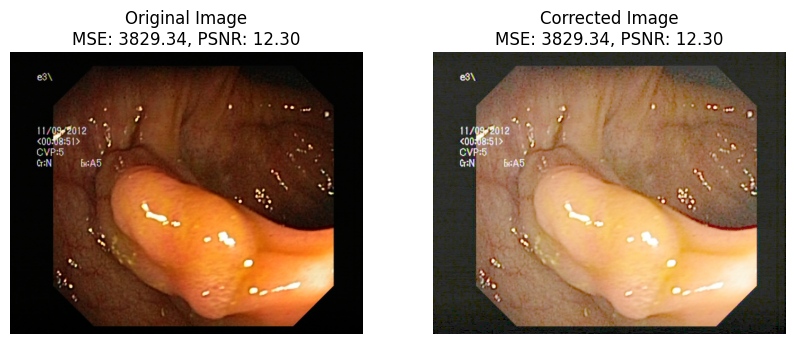

In [16]:
# Example usage:
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg'  # Replace with your image path
gamma_value = 0.4  # Replace with your desired gamma value
gamme(image_path, gamma_value)

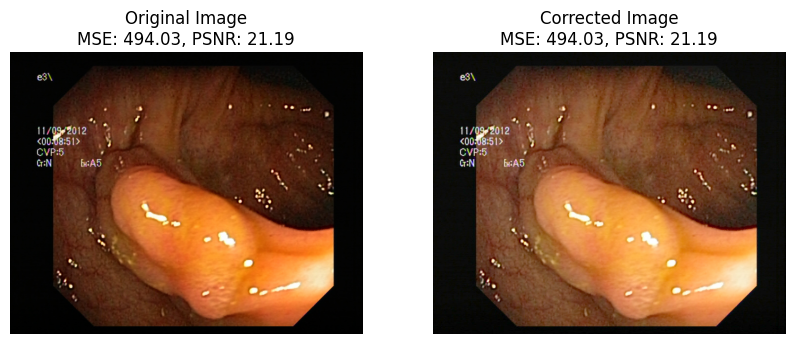

In [17]:
# Example usage:
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg'  # Replace with your image path
gamma_value = 0.7  # Replace with your desired gamma value
gamme(image_path, gamma_value)

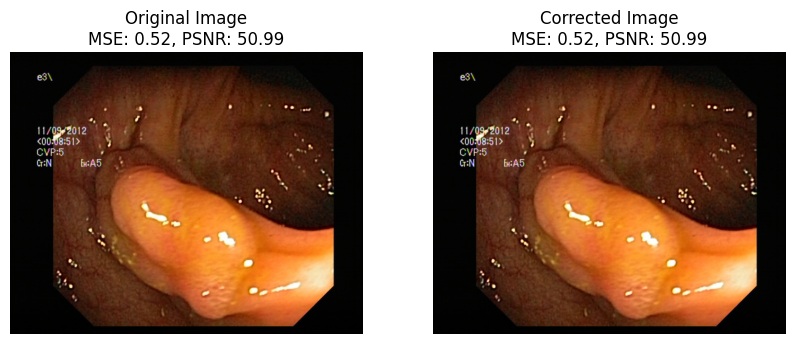

In [19]:
# Example usage:
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg'  # Replace with your image path
gamma_value = 0.98  # Replace with your desired gamma value
gamme(image_path, gamma_value)

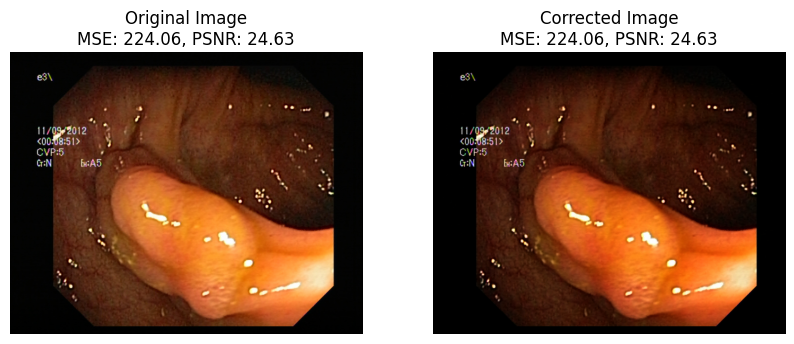

In [20]:
# Example usage:
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg'  # Replace with your image path
gamma_value = 1.3  # Replace with your desired gamma value
gamme(image_path, gamma_value)

HISTOGRAM ENLARGEMENT

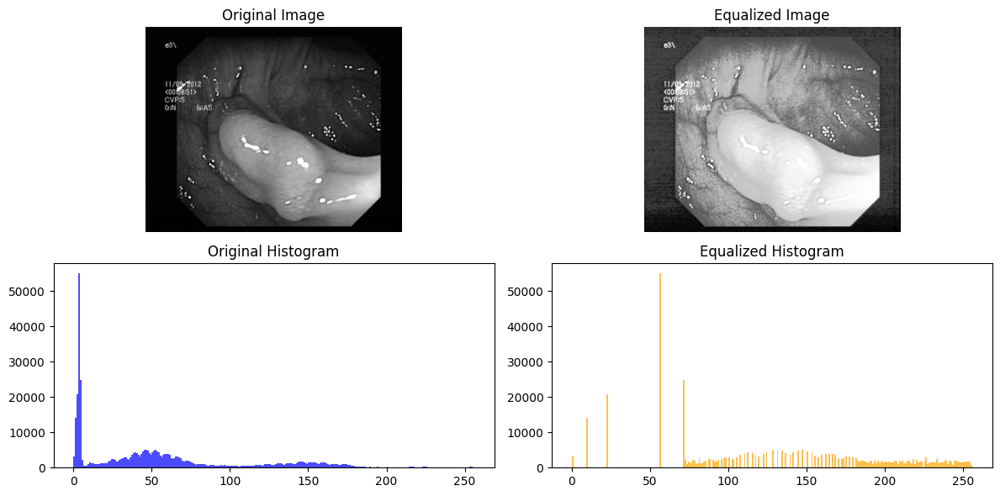

MSE: 5942.822265625
PSNR: 10.390876324273155


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def histogram_equalization(image_path):
    # Read the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(image)

    # Calculate PSNR and MSE between original and equalized images
    mse = np.mean((image.astype(np.float32) - equalized_image.astype(np.float32)) ** 2)
    psnr = cv2.PSNR(image, equalized_image)

    # Plot original image, equalized image, and histograms
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(2, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Equalized Image
    plt.subplot(2, 2, 2)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Equalized Image')
    plt.axis('off')

    # Original Histogram
    plt.subplot(2, 2, 3)
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.7)
    plt.title('Original Histogram')

    # Equalized Histogram
    plt.subplot(2, 2, 4)
    plt.hist(equalized_image.ravel(), bins=256, range=[0, 256], color='orange', alpha=0.7)
    plt.title('Equalized Histogram')

    plt.tight_layout()
    plt.show()

    print(f"MSE: {mse}")
    print(f"PSNR: {psnr}")

# Example usage:
image_path = '/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg'    # Replace with your image path
histogram_equalization(image_path)


Discrete Fourier Transform

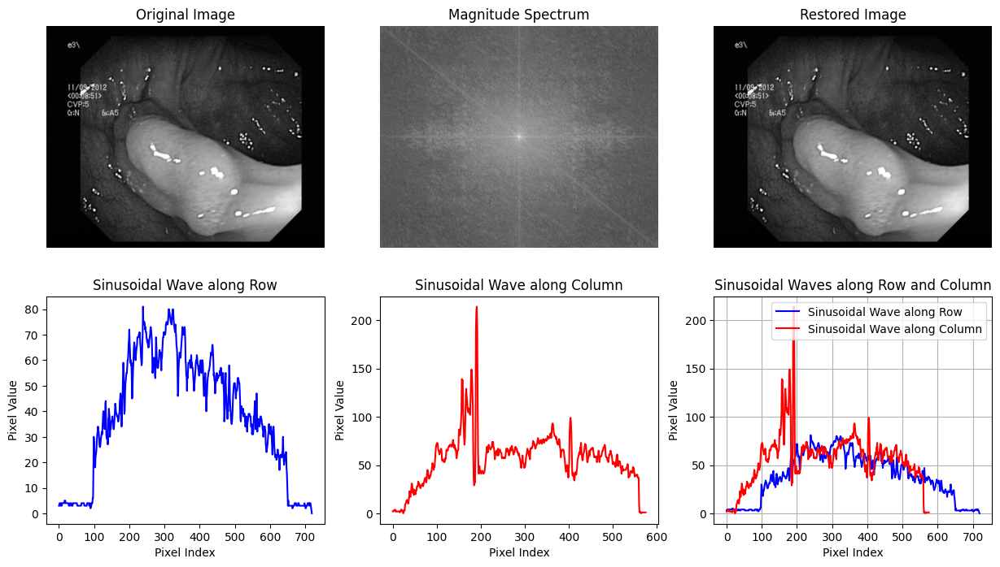

<Figure size 640x480 with 0 Axes>

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Convert image to float32
image_float32 = np.float32(image)

# Compute DFT
dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

# Shift the zero-frequency component to the center of the spectrum
dft_shifted = np.fft.fftshift(dft)

# Compute magnitude spectrum
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shifted[:, :, 0], dft_shifted[:, :, 1]))

# Compute inverse DFT
idft_shifted = np.fft.ifftshift(dft_shifted)
restored_image = cv2.idft(idft_shifted)
restored_image = cv2.magnitude(restored_image[:, :, 0], restored_image[:, :, 1])

# Select row and column indices for plotting waves
row_index = 100  # Choose a row index
col_index = 200  # Choose a column index

# Extract pixel values along the selected row and column
row_values = image[row_index, :]
col_values = image[:, col_index]

# Generate time values for the wave plots
t_row = np.arange(len(row_values))
t_col = np.arange(len(col_values))

# Plot sinusoidal waves along the selected row and column
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(restored_image, cmap='gray')
plt.title('Restored Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.plot(t_row, row_values, color='blue')
plt.title('Sinusoidal Wave along Row')
plt.xlabel('Pixel Index')
plt.ylabel('Pixel Value')

plt.subplot(2, 3, 5)
plt.plot(t_col, col_values, color='red')
plt.title('Sinusoidal Wave along Column')
plt.xlabel('Pixel Index')
plt.ylabel('Pixel Value')

# Plot sinusoidal waves along the selected row and column
plt.subplot(2, 3, 6)

plt.plot(t_row, row_values, color='blue', label='Sinusoidal Wave along Row')
plt.plot(t_col, col_values, color='red', label='Sinusoidal Wave along Column')

plt.title('Sinusoidal Waves along Row and Column')
plt.xlabel('Pixel Index')
plt.ylabel('Pixel Value')
plt.legend()
plt.grid(True)
plt.show()

plt.tight_layout()
plt.show()


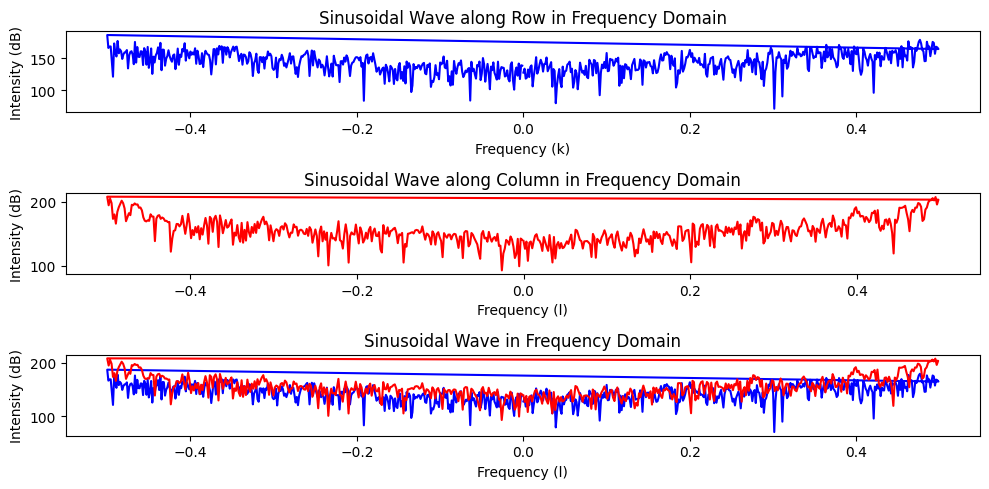

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Convert image to float32
image_float32 = np.float32(image)

# Compute DFT
dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

# Shift the zero-frequency component to the center of the spectrum
dft_shifted = np.fft.fftshift(dft)

# Compute magnitude spectrum
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shifted[:, :, 0], dft_shifted[:, :, 1]))

# Select row and column indices for plotting sinusoidal waves
row_index = 100  # Choose a row index
col_index = 200  # Choose a column index

# Extract pixel values along the selected row and column from the magnitude spectrum
row_values_spectrum = magnitude_spectrum[row_index, :]
col_values_spectrum = magnitude_spectrum[:, col_index]

# Generate frequency domain values for the wave plots
f_row = np.fft.fftfreq(magnitude_spectrum.shape[1])
f_col = np.fft.fftfreq(magnitude_spectrum.shape[0])

# Plot sinusoidal waves along the selected row and column in the frequency domain
plt.figure(figsize=(10, 5))

plt.subplot(3, 1, 1)
plt.plot(f_row, row_values_spectrum, color='blue')
plt.title('Sinusoidal Wave along Row in Frequency Domain')
plt.xlabel('Frequency (k)')
plt.ylabel('Intensity (dB)')

plt.subplot(3, 1, 2)
plt.plot(f_col, col_values_spectrum, color='red')
plt.title('Sinusoidal Wave along Column in Frequency Domain')
plt.xlabel('Frequency (l)')
plt.ylabel('Intensity (dB)')


plt.subplot(3, 1, 3)
plt.plot(f_row, row_values_spectrum, color='blue')
plt.plot(f_col, col_values_spectrum, color='red')
plt.title('Sinusoidal Wave in Frequency Domain')
plt.xlabel('Frequency (l)')
plt.ylabel('Intensity (dB)')

plt.tight_layout()
plt.show()


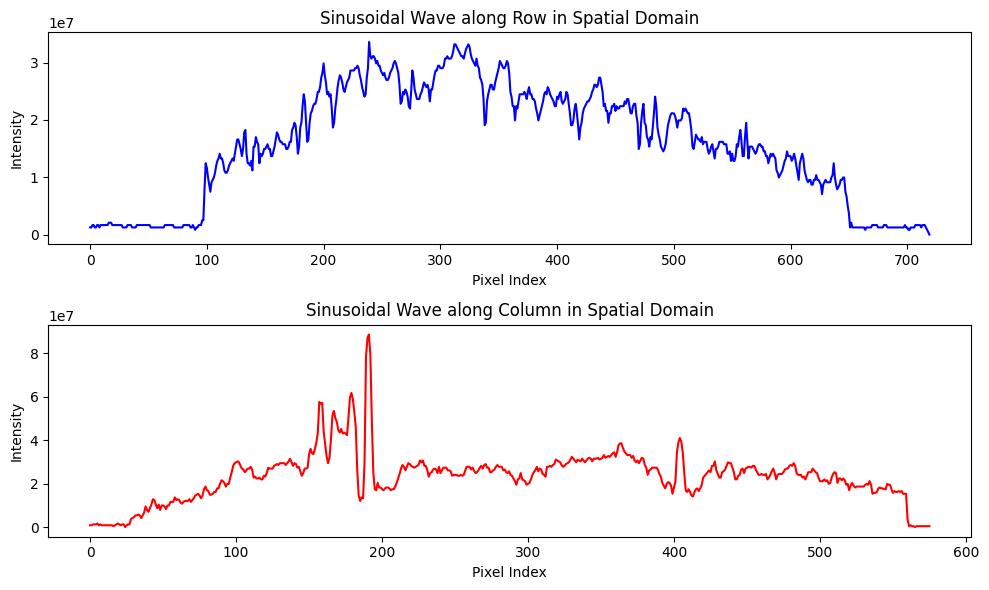

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Convert image to float32
image_float32 = np.float32(image)

# Compute DFT
dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

# Shift the zero-frequency component to the center of the spectrum
dft_shifted = np.fft.fftshift(dft)

# Compute magnitude spectrum
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shifted[:, :, 0], dft_shifted[:, :, 1]))

# Compute inverse DFT
idft_shifted = np.fft.ifftshift(dft_shifted)
restored_image = cv2.idft(idft_shifted)
restored_image = cv2.magnitude(restored_image[:, :, 0], restored_image[:, :, 1])

# Select row and column indices for plotting waves
row_index = 100  # Choose a row index
col_index = 200  # Choose a column index

# Extract pixel values along the selected row and column from the restored image
row_values_restored = restored_image[row_index, :]
col_values_restored = restored_image[:, col_index]

# Generate pixel indices for the wave plots
pixel_indices_row = np.arange(len(row_values_restored))
pixel_indices_col = np.arange(len(col_values_restored))

# Plot sinusoidal waves along the selected row and column in the spatial domain
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(pixel_indices_row, row_values_restored, color='blue')
plt.title('Sinusoidal Wave along Row in Spatial Domain')
plt.xlabel('Pixel Index')
plt.ylabel('Intensity')

plt.subplot(2, 1, 2)
plt.plot(pixel_indices_col, col_values_restored, color='red')
plt.title('Sinusoidal Wave along Column in Spatial Domain')
plt.xlabel('Pixel Index')
plt.ylabel('Intensity')

plt.tight_layout()
plt.show()


# Homomorphic Filter

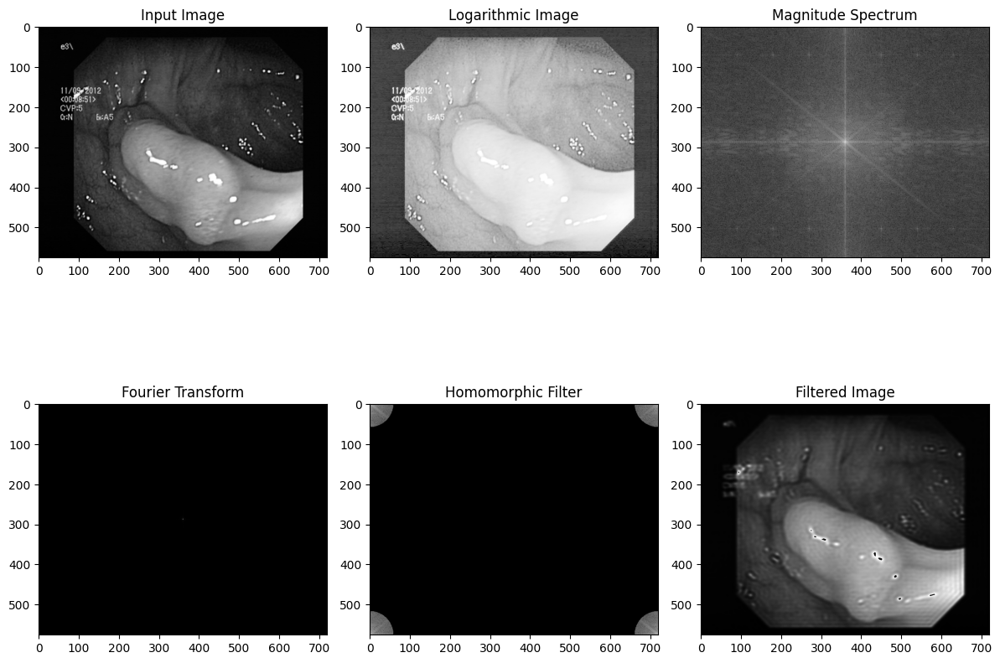

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def homomorphic_filter(image, cutoff_freq, sigma):
    # Step 1: Convert image to logarithmic domain
    image_log = np.log1p(np.float64(image))

    # Step 2: Frequency domain transformation
    image_fft = np.fft.fft2(image_log)
    image_fft_shifted = np.fft.fftshift(image_fft)
    magnitude_spectrum = np.abs(image_fft_shifted)

    # Step 3: Design high-pass filter
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols))
    for i in range(rows):
        for j in range(cols):
            mask[i, j] = (1 - np.exp(-((i - center_row)**2 + (j - center_col)**2) / (2 * sigma**2)))
    mask = 1 - mask
    mask[mask < cutoff_freq] = 0

    # Step 4: Filtering
    image_filtered_fft = image_fft_shifted * mask

    # Step 5: Inverse transformation
    image_filtered = np.fft.ifft2(np.fft.ifftshift(image_filtered_fft))
    image_filtered = np.exp(np.real(image_filtered)) - 1
    image_filtered = np.uint8(image_filtered)

    return magnitude_spectrum, np.fft.ifftshift(image_fft), np.fft.ifftshift(image_filtered_fft), image_filtered

# Load image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Set cutoff frequency and sigma for high-pass filter
cutoff_freq = 0.5
sigma = 50

# Apply homomorphic filtering
magnitude_spectrum, fft_image, fft_filtered_image, filtered_image = homomorphic_filter(image, cutoff_freq, sigma)

# Display each stage
plt.figure(figsize=(12, 10))

plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Input Image')

plt.subplot(2, 3, 2)
plt.imshow(np.log1p(image), cmap='gray')
plt.title('Logarithmic Image')

plt.subplot(2, 3, 3)
plt.imshow(np.log1p(magnitude_spectrum), cmap='gray')
plt.title('Magnitude Spectrum')

plt.subplot(2, 3, 4)
plt.imshow(np.abs(fft_image), cmap='gray')
plt.title('Fourier Transform')

plt.subplot(2, 3, 5)
plt.imshow(np.log1p(np.abs(fft_filtered_image)), cmap='gray')
plt.title('Homomorphic Filter')

plt.subplot(2, 3, 6)
plt.imshow(filtered_image, cmap='gray')
plt.title('Filtered Image')

plt.tight_layout()
plt.show()


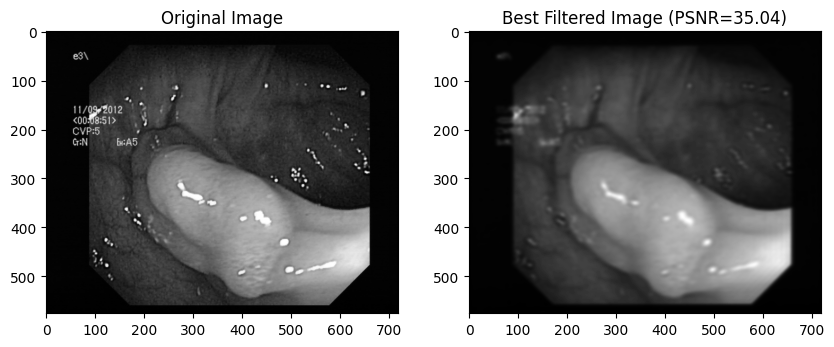

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import ParameterGrid

def homomorphic_filter(image, cutoff_freq, sigma):
    # Step 1: Convert image to logarithmic domain
    image_log = np.log1p(np.float64(image))

    # Step 2: Frequency domain transformation
    image_fft = np.fft.fft2(image_log)
    image_fft_shifted = np.fft.fftshift(image_fft)

    # Step 3: Design high-pass filter
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols))
    for i in range(rows):
        for j in range(cols):
            mask[i, j] = (1 - np.exp(-((i - center_row)**2 + (j - center_col)**2) / (2 * sigma**2)))
    mask = 1 - mask
    mask[mask < cutoff_freq] = 0

    # Step 4: Filtering
    image_filtered_fft = image_fft_shifted * mask

    # Step 5: Inverse transformation
    image_filtered = np.fft.ifft2(np.fft.ifftshift(image_filtered_fft))
    image_filtered = np.exp(np.real(image_filtered)) - 1
    image_filtered = np.uint8(image_filtered)

    return image_filtered

def psnr(image1, image2):
    mse = np.mean((image1 - image2) ** 2)
    if mse == 0:
        return float('inf')
    max_val = np.max(image1)
    return 20 * np.log10(max_val / np.sqrt(mse))

# Load image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Define parameter grid for sigma and cutoff frequency
param_grid = {
    'sigma': [5, 10, 15, 20, 25, 30],
    'cutoff_freq': [0.1, 0.2, 0.3, 0.4, 0.5]
}

# Perform grid search
best_psnr = float('-inf')
best_params = None

for params in ParameterGrid(param_grid):
    sigma = params['sigma']
    cutoff_freq = params['cutoff_freq']
    
    # Apply homomorphic filtering
    filtered_image = homomorphic_filter(image, cutoff_freq, sigma)
    
    # Evaluate performance using PSNR
    score = psnr(image, filtered_image)
    
    # Update best parameters if current PSNR is better
    if score > best_psnr:
        best_psnr = score
        best_params = params
        best_filtered_image = filtered_image

# Display the best filtered image
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(best_filtered_image, cmap='gray')
plt.title('Best Filtered Image (PSNR={:.2f})'.format(best_psnr))
plt.show()


# Arthmetic Mean Filter

PSNR (Noisy Image): 28.222829079775835
PSNR (Filtered Image): 27.88657202992319


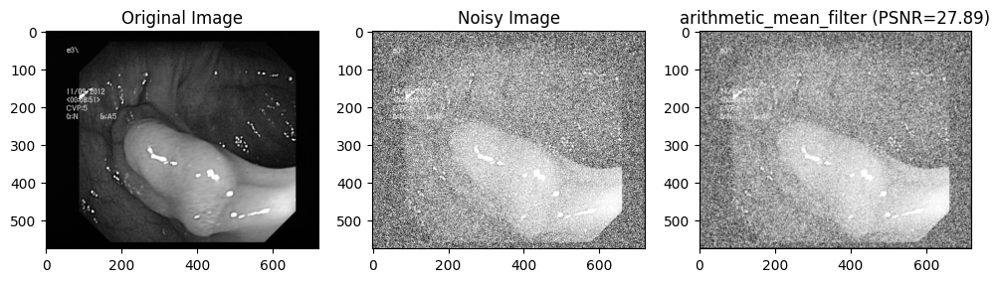

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def psnr(original, noisy, filtered):
    mse_noisy = np.mean((original - noisy) ** 2)
    mse_filtered = np.mean((original - filtered) ** 2)
    
    if mse_noisy == 0:
        psnr_noisy = float('inf')
    else:
        psnr_noisy = 20 * np.log10(255 / np.sqrt(mse_noisy))
    
    if mse_filtered == 0:
        psnr_filtered = float('inf')
    else:
        psnr_filtered = 20 * np.log10(255 / np.sqrt(mse_filtered))
    
    return psnr_noisy, psnr_filtered

def arithmetic_mean_filter(image, k_size):
    pad = k_size // 2
    filtered_image = np.zeros_like(image)
    
    for i in range(pad, image.shape[0] - pad):
        for j in range(pad, image.shape[1] - pad):
            neighborhood = image[i - pad:i + pad + 1, j - pad:j + pad + 1]
            filtered_image[i, j] = np.mean(neighborhood)
    
    return filtered_image

# Load the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Add Gaussian noise to the image
noisy_image = cv2.add(image, np.random.normal(0, 25, image.shape).astype(np.uint8))

# Apply arithmetic mean filter
k_size = 3  # Kernel size (odd number)
filtered_image = arithmetic_mean_filter(noisy_image, k_size)

# Calculate PSNR
psnr_noisy, psnr_filtered = psnr(image, noisy_image, filtered_image)
print("PSNR (Noisy Image):", psnr_noisy)
print("PSNR (Filtered Image):", psnr_filtered)

# Display images
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(filtered_image, cmap='gray')
plt.title('arithmetic_mean_filter (PSNR={:.2f})'.format(psnr_filtered))

plt.show()


# Geomentric Mean Filter

PSNR (Noisy Image): 28.220105490046414
PSNR (Filtered Image): 28.220894129925888


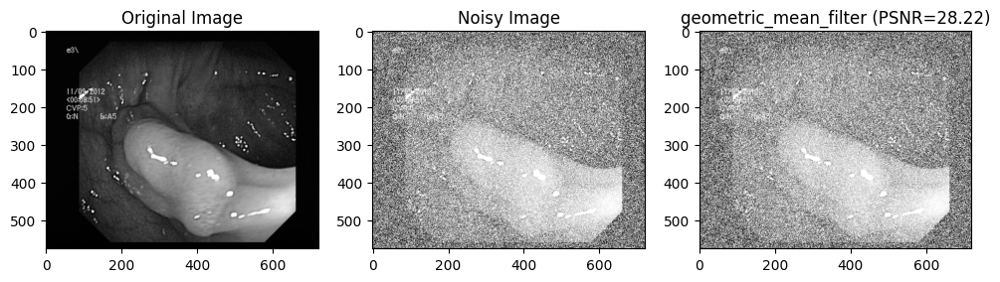

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def psnr(original, noisy, filtered):
    mse_noisy = np.mean((original - noisy) ** 2)
    mse_filtered = np.mean((original - filtered) ** 2)
    
    if mse_noisy == 0:
        psnr_noisy = float('inf')
    else:
        psnr_noisy = 20 * np.log10(255 / np.sqrt(mse_noisy))
    
    if mse_filtered == 0:
        psnr_filtered = float('inf')
    else:
        psnr_filtered = 20 * np.log10(255 / np.sqrt(mse_filtered))
    
    return psnr_noisy, psnr_filtered

def geometric_mean_filter(image, k_size):
    pad = k_size // 2
    filtered_image = np.zeros_like(image)
    
    for i in range(pad, image.shape[0] - pad):
        for j in range(pad, image.shape[1] - pad):
            neighborhood = image[i - pad:i + pad + 1, j - pad:j + pad + 1]
            filtered_image[i, j] = np.prod(neighborhood) ** (1 / (k_size * k_size))
    
    return filtered_image

# Load the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Add Gaussian noise to the image
noisy_image = cv2.add(image, np.random.normal(0, 25, image.shape).astype(np.uint8))

# Apply geometric mean filter
k_size = 1 # Kernel size (odd number)
filtered_image = geometric_mean_filter(noisy_image, k_size)

# Calculate PSNR
psnr_noisy, psnr_filtered = psnr(image, noisy_image, filtered_image)
print("PSNR (Noisy Image):", psnr_noisy)
print("PSNR (Filtered Image):", psnr_filtered)

# Display images
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(filtered_image, cmap='gray')
plt.title('geometric_mean_filter (PSNR={:.2f})'.format(psnr_filtered))

plt.show()


# Alpha-trimmed Mean Filter

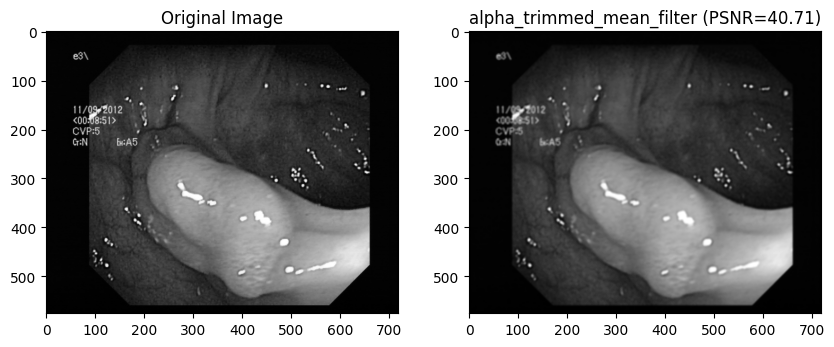

In [13]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def psnr(original, filtered):
    mse = np.mean((original - filtered) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

def alpha_trimmed_mean_filter(image, k_size, alpha):
    # Define the padding size
    pad = k_size // 2
    
    # Create an output image with the same size as the input image
    filtered_image = np.zeros_like(image)
    
    # Iterate over each pixel in the image
    for i in range(pad, image.shape[0] - pad):
        for j in range(pad, image.shape[1] - pad):
            # Get the neighborhood around the current pixel
            neighborhood = image[i - pad:i + pad + 1, j - pad:j + pad + 1]
            
            # Flatten the neighborhood into a 1D array and sort it
            sorted_values = np.sort(neighborhood.flatten())
            
            # Calculate the number of elements to be trimmed on both ends
            num_trimmed = int(alpha * len(sorted_values))
            
            # Compute the trimmed mean excluding the extreme values
            trimmed_mean = np.mean(sorted_values[num_trimmed:-num_trimmed])
            
            # Assign the computed mean to the central pixel in the output image
            filtered_image[i, j] = trimmed_mean
    
    return filtered_image

# Load the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Define the kernel size and alpha value
k_size = 5  # Kernel size (odd number)
alpha = 0.1  # Alpha value (percentage of pixels to be trimmed)

# Apply the alpha-trimmed mean filter
filtered_image = alpha_trimmed_mean_filter(image, k_size, alpha)

# Calculate PSNR
# psnr_value = psnr(image, filtered_image)
# print("PSNR:", psnr_value)

# Display the original and filtered images
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('alpha_trimmed_mean_filter (PSNR={:.2f})'.format(psnr_value))
plt.show()


# Adaptive Mean Filter

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def adaptive_mean_filter(image, max_kernel_size):
    filtered_image = np.zeros_like(image)
    
    # Iterate over each pixel in the image
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            # Define the initial kernel size
            kernel_size = 3
            
            # Iterate over increasing kernel sizes until a suitable one is found
            while kernel_size <= max_kernel_size:
                # Calculate the bounds of the neighborhood
                top = max(0, i - kernel_size // 2)
                bottom = min(image.shape[0], i + kernel_size // 2 + 1)
                left = max(0, j - kernel_size // 2)
                right = min(image.shape[1], j + kernel_size // 2 + 1)
                
                # Extract the neighborhood
                neighborhood = image[top:bottom, left:right]
                
                # Compute the mean of the neighborhood
                mean_value = np.mean(neighborhood)
                
                # Check if the pixel value is within a certain threshold of the mean
                if abs(image[i, j] - mean_value) <= 10:  # Adjust the threshold as needed
                    filtered_image[i, j] = mean_value
                    break  # Exit the loop if suitable kernel size is found
                
                # Increase the kernel size for the next iteration
                kernel_size += 2  # Increase by 2 to keep the kernel size odd (e.g., 3, 5, 7, ...)
    
    return filtered_image

# Load the input image
image = cv2.imread('/content/corrected_image.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply the adaptive mean filter with a maximum kernel size
filtered_image = adaptive_mean_filter(gray_image, max_kernel_size=15)  # Adjust max_kernel_size as needed

# Convert the filtered image back to color
filtered_image_color = cv2.cvtColor(filtered_image, cv2.COLOR_GRAY2BGR)

# Display the original and filtered images
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(filtered_image_color, cv2.COLOR_BGR2RGB))
plt.title('Filtered Image')
plt.show()

# Save the filtered image
output_path = 'filtered_image.png'
cv2.imwrite(output_path, filtered_image_color)
print("Filtered image saved as:", output_path)


[ WARN:0@2068.523] global loadsave.cpp:248 findDecoder imread_('/content/corrected_image.png'): can't open/read file: check file path/integrity


error: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


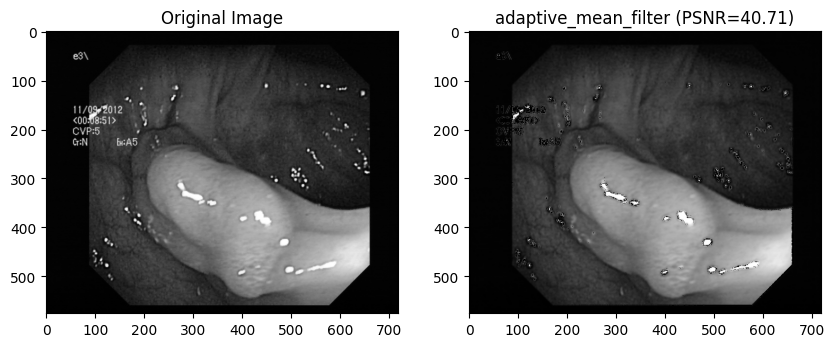

In [12]:
import cv2
import numpy as np

def psnr(original, filtered):
    mse = np.mean((original - filtered) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

def adaptive_mean_filter(image, max_kernel_size):
    filtered_image = np.zeros_like(image)
    
    # Iterate over each pixel in the image
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            # Define the initial kernel size
            kernel_size = 3
            
            # Iterate over increasing kernel sizes until a suitable one is found
            while kernel_size <= max_kernel_size:
                # Calculate the bounds of the neighborhood
                top = max(0, i - kernel_size // 2)
                bottom = min(image.shape[0], i + kernel_size // 2 + 1)
                left = max(0, j - kernel_size // 2)
                right = min(image.shape[1], j + kernel_size // 2 + 1)
                
                # Extract the neighborhood
                neighborhood = image[top:bottom, left:right]
                
                # Compute the mean of the neighborhood
                mean_value = np.mean(neighborhood)
                
                # Check if the pixel value is within a certain threshold of the mean
                if abs(image[i, j] - mean_value) <= 10:  # Adjust the threshold as needed
                    filtered_image[i, j] = mean_value
                    break  # Exit the loop if suitable kernel size is found
                
                # Increase the kernel size for the next iteration
                kernel_size += 2  # Increase by 2 to keep the kernel size odd (e.g., 3, 5, 7, ...)
    
    return filtered_image

# Load the input image
original_image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Apply the adaptive mean filter with a maximum kernel size
filtered_image = adaptive_mean_filter(original_image, max_kernel_size=15)  # Adjust max_kernel_size as needed

# Calculate PSNR
# psnr_value = psnr(original_image, filtered_image)
# print("Peak Signal-to-Noise Ratio (PSNR):", psnr_value)

# Display the original and filtered images
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('adaptive_mean_filter (PSNR={:.2f})'.format(psnr_value))
plt.show()


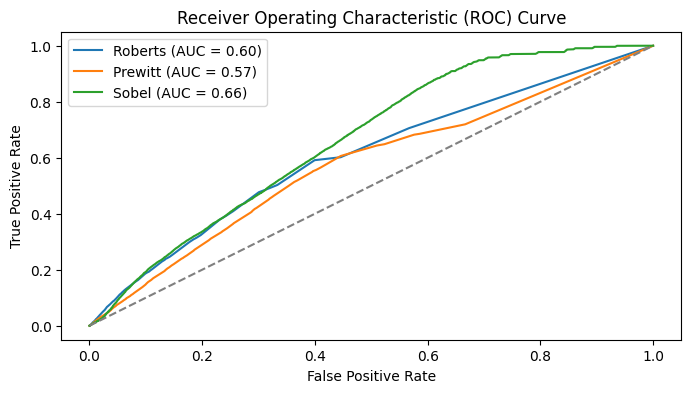

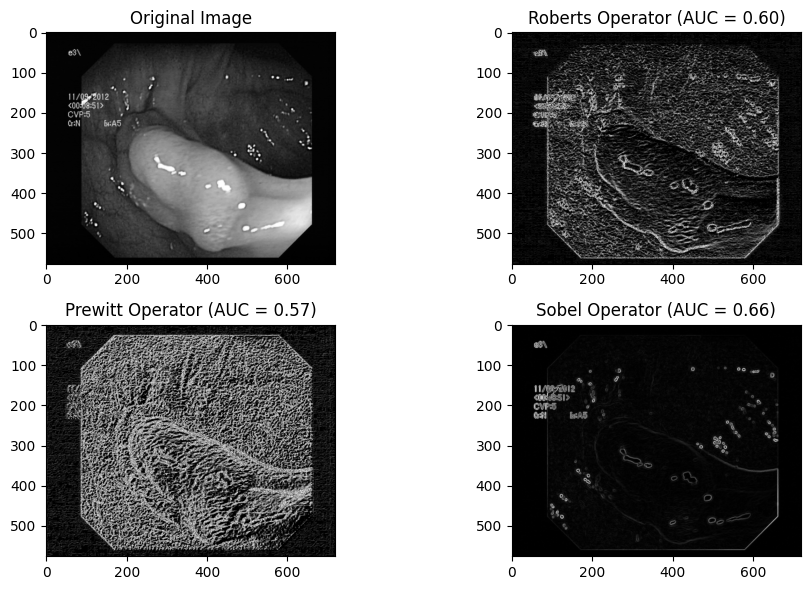

In [8]:
import cv2
import numpy as np
from skimage import filters
from sklearn import metrics
import matplotlib.pyplot as plt

# Load the test image
original_image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', cv2.IMREAD_GRAYSCALE)

# Generate synthetic ground truth edges (for demonstration purposes)
ground_truth_edges = np.zeros_like(image)
ground_truth_edges[100:200, 200:300] = 255

# Normalize ground truth edges to 0 and 1
ground_truth_edges = ground_truth_edges / 255

# Roberts Operator
roberts_x = np.array([[1, 0], [0, -1]])
roberts_y = np.array([[0, 1], [-1, 0]])

roberts_edge_x = cv2.filter2D(image, -1, roberts_x)
roberts_edge_y = cv2.filter2D(image, -1, roberts_y)
roberts_magnitude = np.sqrt(roberts_edge_x**2 + roberts_edge_y**2)

# Prewitt Operator
prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

prewitt_edge_x = cv2.filter2D(image, -1, prewitt_x)
prewitt_edge_y = cv2.filter2D(image, -1, prewitt_y)
prewitt_magnitude = np.sqrt(prewitt_edge_x**2 + prewitt_edge_y**2)

# Sobel Operator
sobel_edge_x = filters.sobel_h(image)
sobel_edge_y = filters.sobel_v(image)
sobel_magnitude = np.sqrt(sobel_edge_x**2 + sobel_edge_y**2)

# Compute AUC for each edge detection method
roberts_auc = metrics.roc_auc_score(ground_truth_edges.ravel(), roberts_magnitude.ravel())
prewitt_auc = metrics.roc_auc_score(ground_truth_edges.ravel(), prewitt_magnitude.ravel())
sobel_auc = metrics.roc_auc_score(ground_truth_edges.ravel(), sobel_magnitude.ravel())

# Plot ROC curve
fpr_roberts, tpr_roberts, _ = metrics.roc_curve(ground_truth_edges.ravel(), roberts_magnitude.ravel())
fpr_prewitt, tpr_prewitt, _ = metrics.roc_curve(ground_truth_edges.ravel(), prewitt_magnitude.ravel())
fpr_sobel, tpr_sobel, _ = metrics.roc_curve(ground_truth_edges.ravel(), sobel_magnitude.ravel())

plt.figure(figsize = (8,4))
plt.plot(fpr_roberts, tpr_roberts, label=f'Roberts (AUC = {roberts_auc:.2f})')
plt.plot(fpr_prewitt, tpr_prewitt, label=f'Prewitt (AUC = {prewitt_auc:.2f})')
plt.plot(fpr_sobel, tpr_sobel, label=f'Sobel (AUC = {sobel_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# Display original image
plt.figure(figsize=(10, 6))
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

# Display Roberts edge detection output
plt.subplot(2, 2, 2)
plt.imshow(roberts_magnitude, cmap='gray')
plt.title(f'Roberts Operator (AUC = {roberts_auc:.2f})')

# Display Prewitt edge detection output
plt.subplot(2, 2, 3)
plt.imshow(prewitt_magnitude, cmap='gray')
plt.title(f'Prewitt Operator (AUC = {prewitt_auc:.2f})')

# Display Sobel edge detection output
plt.subplot(2, 2, 4)
plt.imshow(sobel_magnitude, cmap='gray')
plt.title(f'Sobel Operator (AUC = {sobel_auc:.2f})')

plt.tight_layout()
plt.show()


# Interpolation

1. Linear Interpolation

PSNR: 74.51135246007556 dB
MSE: 0.002301151


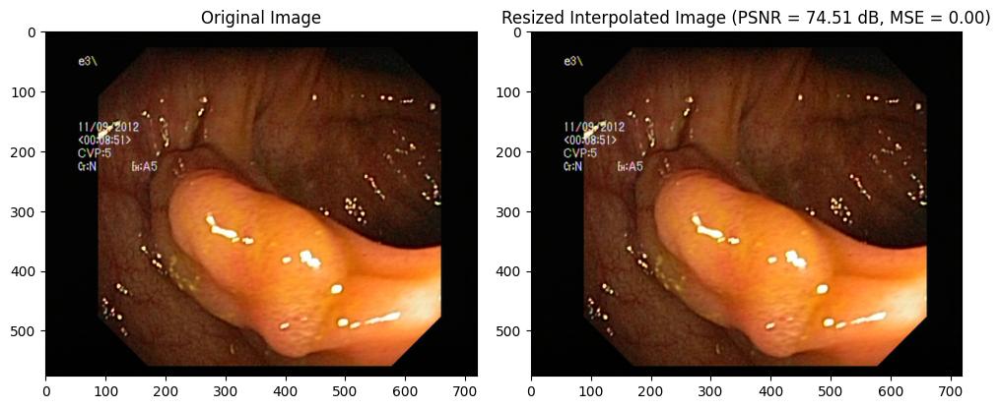

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def resize_image_linear(image, new_width, new_height):
    # Get the dimensions of the original image
    original_height, original_width = image.shape[:2]
    
    # Create a new blank image with the desired dimensions
    resized_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    
    # Calculate the scaling factors for width and height
    scale_x = original_width / new_width
    scale_y = original_height / new_height
    
    # Perform linear interpolation to fill in the values of the new image
    for y in range(new_height):
        for x in range(new_width):
            # Find the corresponding position in the original image
            original_x = x * scale_x
            original_y = y * scale_y
            
            # Find the surrounding integer coordinates
            x1, y1 = int(original_x), int(original_y)
            x2, y2 = min(x1 + 1, original_width - 1), min(y1 + 1, original_height - 1)
            
            # Perform linear interpolation for each channel
            for c in range(3):
                interpolated_value = image[y1, x1, c] * (x2 - original_x) * (y2 - original_y) + \
                                      image[y1, x2, c] * (original_x - x1) * (y2 - original_y) + \
                                      image[y2, x1, c] * (x2 - original_x) * (original_y - y1) + \
                                      image[y2, x2, c] * (original_x - x1) * (original_y - y1)
                # Assign the interpolated value to the new image
                resized_image[y, x, c] = interpolated_value.astype(np.uint8)
    
    return resized_image

def calculate_psnr(img1, img2):
    mse = np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr, mse

def calculate_mse(img1, img2):
    mse = np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)
    return mse

# Load the image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg')

# Resize the image using linear interpolation
resized_image = resize_image_linear(image, new_width=720, new_height=576)

# Calculate PSNR and MSE between original and resized images
psnr_value, mse_value = calculate_psnr(image, resized_image)
print("PSNR:", psnr_value, "dB")
print("MSE:", mse_value)

# Plotting
plt.figure(figsize=(10, 5))

# Plot original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# Plot resized image
plt.subplot(1, 2, 2)
plt.title(f'Resized Interpolated Image (PSNR = {psnr_value:.2f} dB, MSE = {mse_value:.2f})')
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))

plt.tight_layout()
plt.show()


2.Bicubic Interpolation

PSNR: 42.062310669110275 dB
MSE: 4.0443552276234565


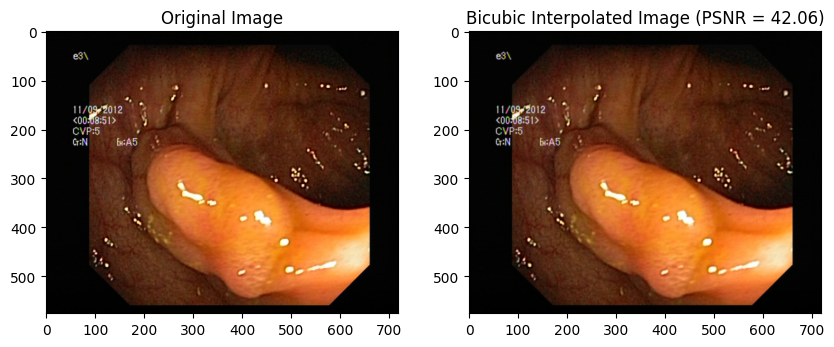

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def bicubic_interpolation(img, scale_factor):
    height, width = img.shape[:2]
    new_height = int(height * scale_factor)
    new_width = int(width * scale_factor)

    # Create empty image with new dimensions
    interpolated_img = np.zeros((new_height, new_width, img.shape[2]), dtype=np.uint8)

    # Compute the inverse scale factors
    x_scale = width / new_width
    y_scale = height / new_height

    # Iterate over each pixel in the new image
    for y in range(new_height):
        for x in range(new_width):
            # Map the new pixel back to the original image
            src_x = x * x_scale
            src_y = y * y_scale

            # Find the four nearest pixels in the original image
            x0 = int(src_x)
            x1 = min(x0 + 1, width - 1)
            y0 = int(src_y)
            y1 = min(y0 + 1, height - 1)

            # Compute the fractional part
            tx = src_x - x0
            ty = src_y - y0

            # Perform bicubic interpolation
            interpolated_img[y, x] = (
                (1 - tx) * (1 - ty) * img[y0, x0] +
                tx * (1 - ty) * img[y0, x1] +
                (1 - tx) * ty * img[y1, x0] +
                tx * ty * img[y1, x1]
            ).clip(0, 255)  # Clip values to [0, 255]

    return interpolated_img

def calculate_psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr, mse

# Read an image
image = cv2.imread('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg')

# Scale factor for interpolation
scale_factor = 2

# Perform bicubic interpolation
interpolated_image = bicubic_interpolation(image, scale_factor)

# Resize the interpolated image to match the dimensions of the original image
resized_interpolated_image = cv2.resize(interpolated_image, (image.shape[1], image.shape[0]))

# Calculate PSNR and MSE
psnr, mse = calculate_psnr(image, resized_interpolated_image)
print("PSNR:", psnr, "dB")
print("MSE:", mse)

# Display the original and resized interpolated images
# Plotting
plt.figure(figsize=(10, 5))

# Plot original data points
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# Plot resized interpolated values
plt.subplot(1, 2, 2)
plt.title(f'Bicubic Interpolated Image (PSNR = {psnr:.2f})')
plt.imshow(cv2.cvtColor(resized_interpolated_image, cv2.COLOR_BGR2RGB))

plt.show()


In [ ]:
import cv2
import numpy as np
from sklearn.mixture import GaussianMixture
from skimage.filters import sobel
from sklearn.metrics import mean_squared_error
from math import log10
import matplotlib.pyplot as plt

def evaluate_image_processing(image_path, n_components=5):
    # Load the input image
    input_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Apply Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_components)
    gmm.fit(input_image.reshape(-1, 1))
    segmented_image = gmm.predict(input_image.reshape(-1, 1)).reshape(input_image.shape)
    
    # Convert segmented image to uint8
    segmented_image = np.uint8(segmented_image)
    
    # Apply Adaptive Mean Filter
    adaptive_mean = cv2.adaptiveThreshold(segmented_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Apply Sobel filter for edge detection
    edges = sobel(adaptive_mean)
    
    # Calculate PSNR
    psnr = 10 * log10((255**2) / mean_squared_error(input_image.flatten(), edges.flatten()))
    
    # Plotting
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 3, 1)
    plt.imshow(input_image, cmap='gray')
    plt.title('Input Image')
    
    plt.subplot(2, 3, 2)
    plt.imshow(segmented_image, cmap='gray')
    plt.title('Segmented Image (GMM)')
    
    plt.subplot(2, 3, 3)
    plt.imshow(adaptive_mean, cmap='gray')
    plt.title('Adaptive Mean Filter')
    
    plt.subplot(2, 3, 4)
    plt.imshow(edges, cmap='gray')
    plt.title('Edge Detected Image (Sobel)')
    
    plt.tight_layout()
    plt.show()
    
    print(f"PSNR: {psnr:.2f} dB")


# Example usage
evaluate_image_processing('/kaggle/input/kvasir-dataset/kvasir-dataset/polyps/058aa0f5-e4be-48f8-bb12-27173a69c2f8.jpg', n_components=5)
